

**<h1 style="text-align:center;">PRICE DETECTOR</h1>**

                                            

1. **Objective:** get a model to predict the house value with more acurracy.
2. **Steps to follow:**
    1. Get the data from the CSV.
    2. Analyze the data (EDA).
    3. Treat the data in the proper way to be able to use it to train a model with it (Use of Pipelines).
    4. Analyze different type of models, optimize their hyperparameters and see which one gives better results.
    5. Test the best model.

<h1 style="text-align:center;">Get the data</h1>

In [1]:
import pandas as pd
df = pd.read_csv('housing.csv')
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


<h1 style="text-align:center;">EDA</h1>

EDA. Deal with null values

In [2]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

As we can see in the total_bedrooms we have 207 missing values so lets fill this with the median value.Steps:
1. Separate numeric data from non numeric
2. Create a imputer and fill missing values with the median.


In [3]:
# Importar la clase SimpleImputer desde sklearn.impute
from sklearn.impute import SimpleImputer
data_num = df.drop(['ocean_proximity'], axis = 1)
imputer = SimpleImputer(strategy="median")
imputer.fit(data_num)
imputer.statistics_
X = imputer.transform(data_num)
data_num_filled_EDA = pd.DataFrame(X, columns=data_num.columns, index=df.index)
data_num_filled_EDA.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
dtype: int64

EDA. Central point of each feature: mean, median e mode

In [4]:

mean = data_num_filled_EDA.mean()
median = data_num_filled_EDA.median()
mode = data_num_filled_EDA.mode().iloc[0]

print("Mean: ")
print(mean)

print("\nMedian: ")
print(median)

print("\nMode: ")
print(mode)

Mean: 
longitude               -119.569704
latitude                  35.631861
housing_median_age        28.639486
total_rooms             2635.763081
total_bedrooms           536.838857
population              1425.476744
households               499.539680
median_income              3.870671
median_house_value    206855.816909
dtype: float64

Median: 
longitude               -118.4900
latitude                  34.2600
housing_median_age        29.0000
total_rooms             2127.0000
total_bedrooms           435.0000
population              1166.0000
households               409.0000
median_income              3.5348
median_house_value    179700.0000
dtype: float64

Mode: 
longitude               -118.310
latitude                  34.060
housing_median_age        52.000
total_rooms             1527.000
total_bedrooms           435.000
population               891.000
households               306.000
median_income              3.125
median_house_value    500001.000
Name: 0, dtype: fl

EDA. Spread of each feature: standard deviation and range

In [5]:
std_deviation = data_num_filled_EDA.std()
range = data_num_filled_EDA.max() - data_num_filled_EDA.min()

print("Standard deviation:")
print(std_deviation)
print("\nRange: ")
print(range)

Standard deviation:
longitude                  2.003532
latitude                   2.135952
housing_median_age        12.585558
total_rooms             2181.615252
total_bedrooms           419.391878
population              1132.462122
households               382.329753
median_income              1.899822
median_house_value    115395.615874
dtype: float64

Range: 
longitude                 10.0400
latitude                   9.4100
housing_median_age        51.0000
total_rooms            39318.0000
total_bedrooms          6444.0000
population             35679.0000
households              6081.0000
median_income             14.5002
median_house_value    485002.0000
dtype: float64


EDA. Visualisation of the characteristics of each feature: histograms and distribution plots

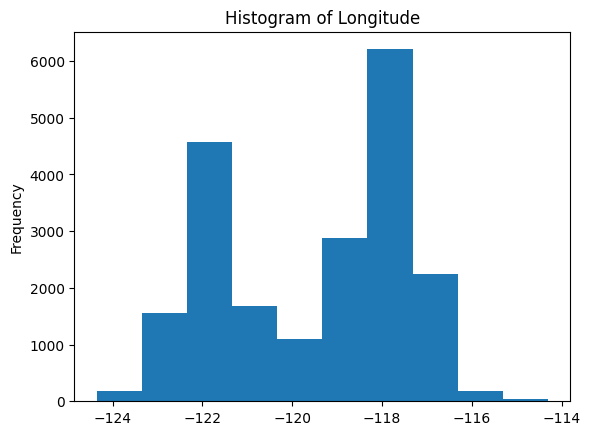

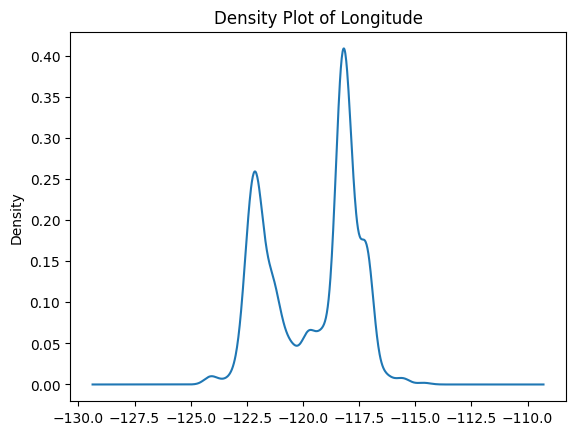

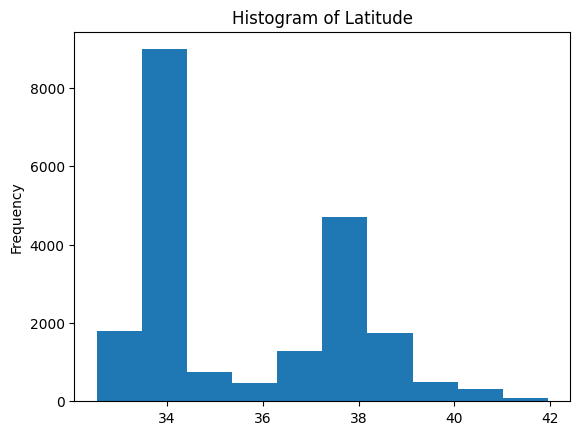

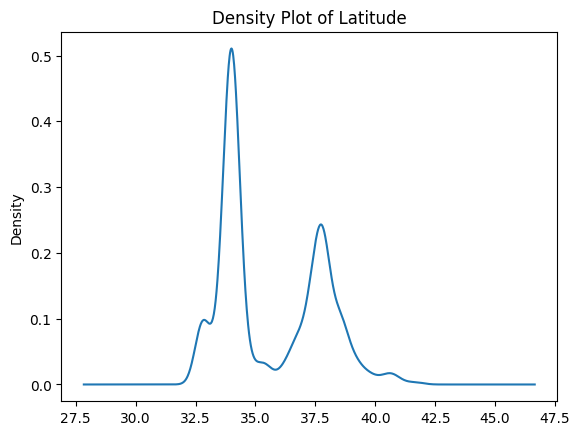

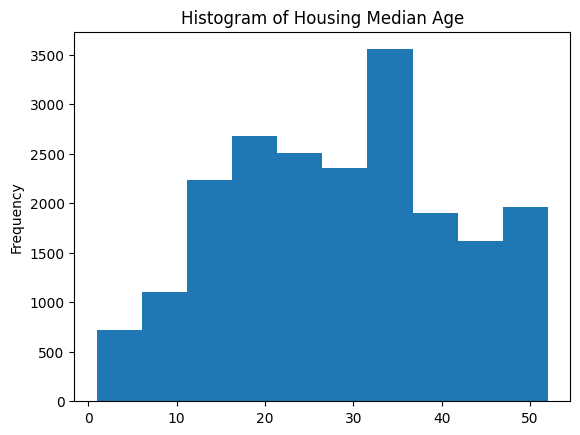

...

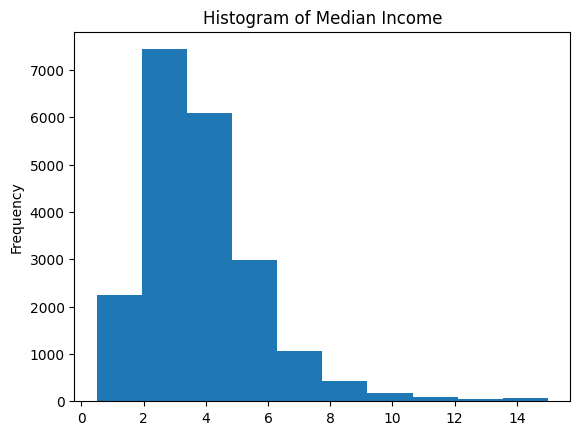

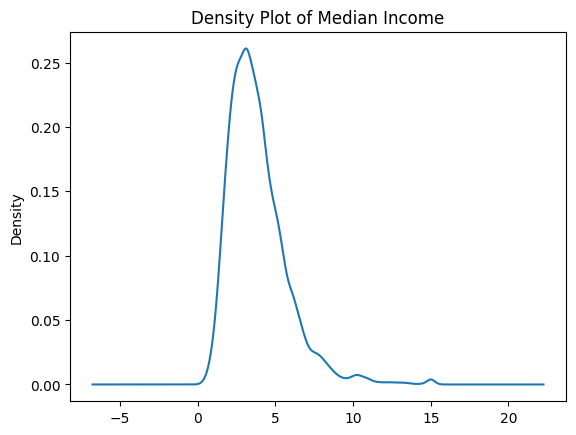

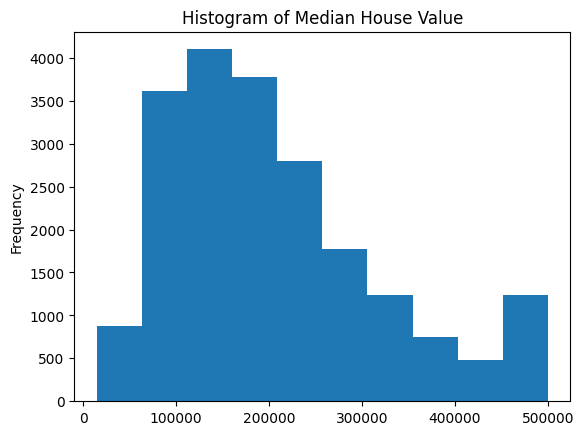

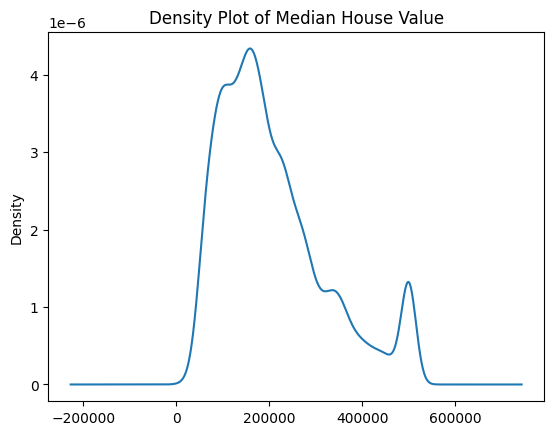

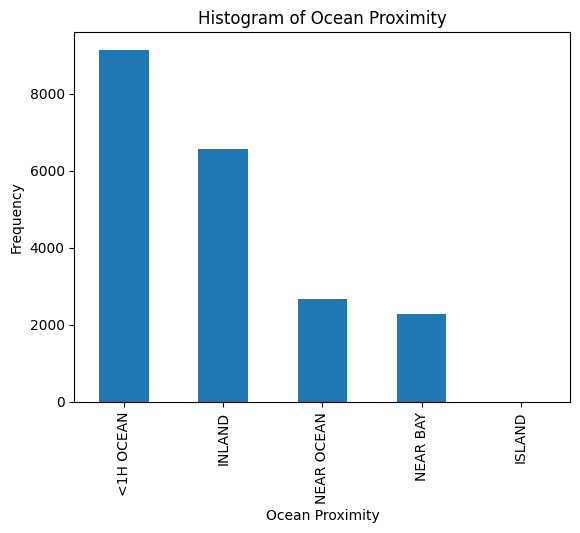

In [6]:
import matplotlib.pyplot as plt

(data_num_filled_EDA['longitude'].astype(float)).plot(kind='hist')
plt.title('Histogram of Longitude')
plt.show()

(data_num_filled_EDA['longitude'].astype(float)).plot(kind='density')
plt.title('Density Plot of Longitude')
plt.show()

(data_num_filled_EDA['latitude'].astype(float)).plot(kind='hist')
plt.title('Histogram of Latitude')
plt.show()

(data_num_filled_EDA['latitude'].astype(float)).plot(kind='density')
plt.title('Density Plot of Latitude')
plt.show()


(data_num_filled_EDA['housing_median_age'].astype(float)).plot(kind='hist')
plt.title('Histogram of Housing Median Age')
plt.show()

(data_num_filled_EDA['housing_median_age'].astype(float)).plot(kind='density')
plt.title('Density Plot of Housing Median Age')
plt.show()


(data_num_filled_EDA['total_rooms'].astype(float)).plot(kind='hist')
plt.title('Histogram of Total Rooms')
plt.show()

(data_num_filled_EDA['total_rooms'].astype(float)).plot(kind='density')
plt.title('Density Plot of Total Rooms')
plt.show()

(data_num_filled_EDA['total_bedrooms'].astype(float)).plot(kind='hist')
plt.title('Histogram of Total Bedrooms')
plt.show()

(data_num_filled_EDA['total_bedrooms'].astype(float)).plot(kind='density')
plt.title('Density Plot of Total Bedrooms')
plt.show()

(data_num_filled_EDA['population'].astype(float)).plot(kind='hist')
plt.title('Histogram of Population')
plt.show()

(data_num_filled_EDA['population'].astype(float)).plot(kind='density')
plt.title('Density Plot of Population')
plt.show()

(data_num_filled_EDA['households'].astype(float)).plot(kind='hist')
plt.title('Histogram of Households')
plt.show()

(data_num_filled_EDA['households'].astype(float)).plot(kind='density')
plt.title('Density Plot of Households')
plt.show()


(data_num_filled_EDA['median_income'].astype(float)).plot(kind='hist')
plt.title('Histogram of Median Income')
plt.show()

(data_num_filled_EDA['median_income'].astype(float)).plot(kind='density')
plt.title('Density Plot of Median Income')
plt.show()


(data_num_filled_EDA['median_house_value'].astype(float)).plot(kind='hist')
plt.title('Histogram of Median House Value')
plt.show()


(data_num_filled_EDA['median_house_value'].astype(float)).plot(kind='density')
plt.title('Density Plot of Median House Value')
plt.show()


df['ocean_proximity'].value_counts().plot(kind='bar')
plt.xlabel('Ocean Proximity')
plt.ylabel('Frequency')
plt.title('Histogram of Ocean Proximity')
plt.show()



__Observation of Hisograms and Density Plots:__
1. Longitude: values are aproximately between -124 and -112 and the most frequent values are around -118 and then around -112.
2. Latitude: values are aproximately between 32.5 and 41 and the most freuqent values are around 34 and then around 38.
3. Housing median age: values are between 0 and around 50 and the values are more homogenious than the previous one but have a frequency peak around the value 35.
4. Total rooms: values are between 0 and around 20000  but is very unbalanced beacause the mayority of the values are between 0 and 5000.
5. Total bedrooms: values are between 0 and around 3000  but is very unbalanced beacause the mayority of the values are between 0 and 1000.
6. Population: values are between 0 and around 10000  but is very unbalanced beacause the mayority of the values are between 0 and 4000.
7. Households: values are between 0 and around 3000  but is very unbalanced beacause the mayority of the values are between 0 and 500.
8. Median Income: values are aproximately between 0 and 15 it is not as unbalanced as the previous one but we can still see a frequency peak around 3.
9. Median house value: values are aproximately between 0 and 500000, it has a frequency peak around 150000 then it frequency decrease until around 400000 and then around 500000 it has an increasement .
10. Ocean proximity:
    - <1H OCEAN is the most frequent with more than 8000 appearances.
    - INLAND is around the 6000 appearances.
    - NEAR OCEAN is around 2000.
    - NEAR BAY is less frquent than NEAR OCEAN but also around 2000 appearances.
    - ISLAND is the less frequent of all them by far, its appearances is almost neglictible in comparison the other ones.


EDA. Relationships between characteristics: correlation and dispersion matrix

In [7]:
corr_matrix = data_num_filled_EDA.corr()
corr_matrix['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049457
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

__Observation about Correlation:__
We are computing the correlation of the variables with the median_house_value.
The most near to 1 the correlation is indicates that there is positive correlation that means that as the value of median_house_value increases the other variable also increases.
The most near to -1 the correlation is indicates that there is negative correlation that means that as the value of median_house_value increases the other variable decreases.

After knowing this and seeing the result of the correlation we can say:
- Median Income is by far the most positive coreralated with the median_house_value with a correlation of 0.688075.
- Latitude is the most negative correlated with the median_house_value with a correlation of -0.144160


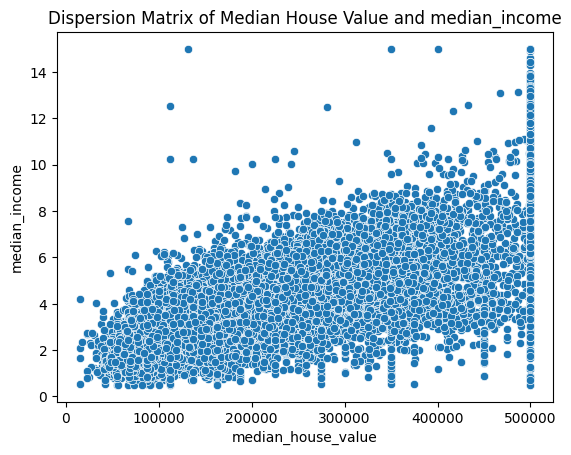

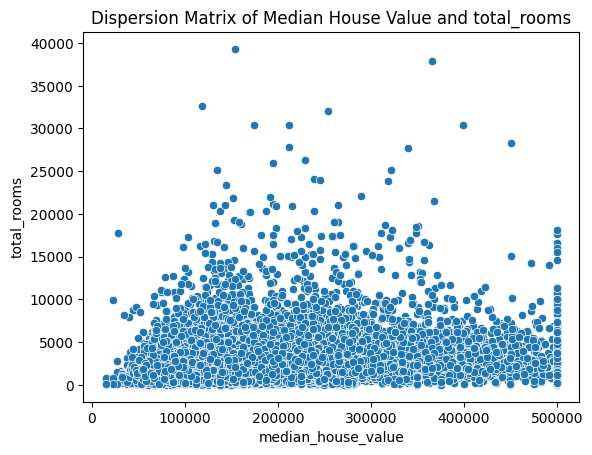

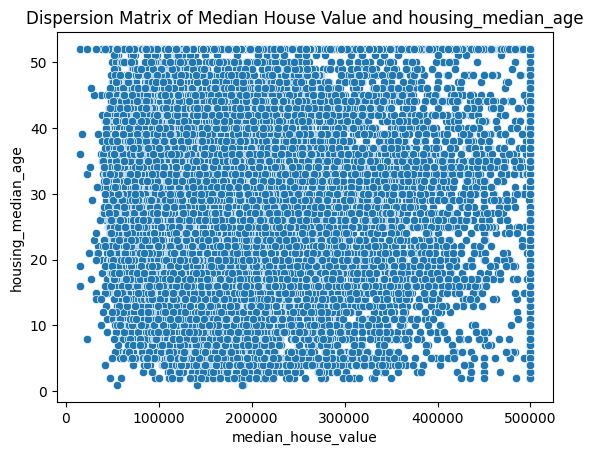

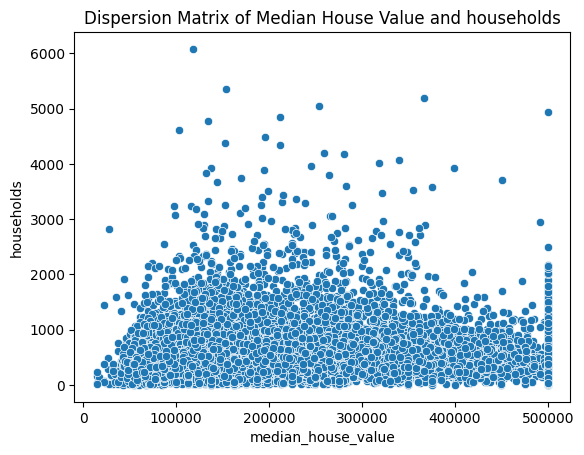

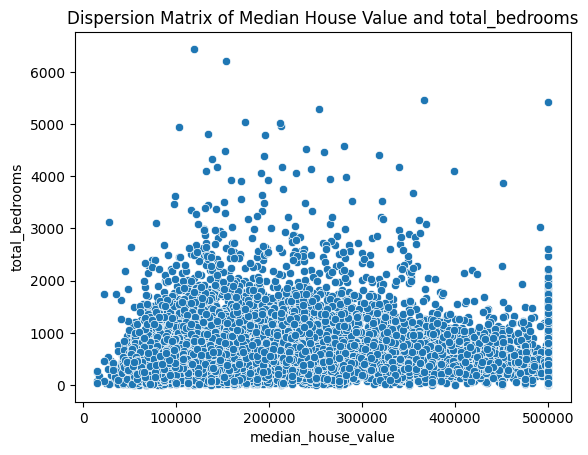

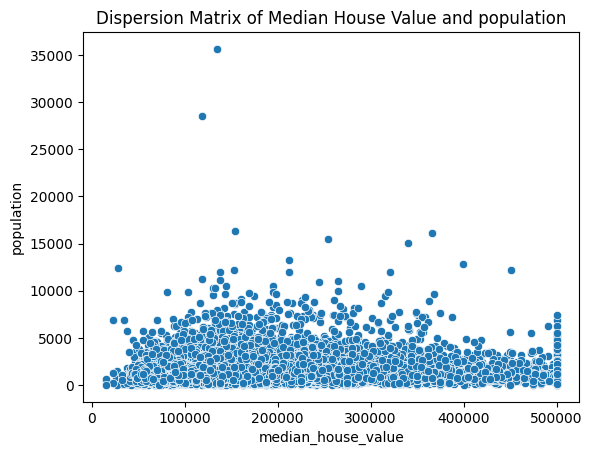

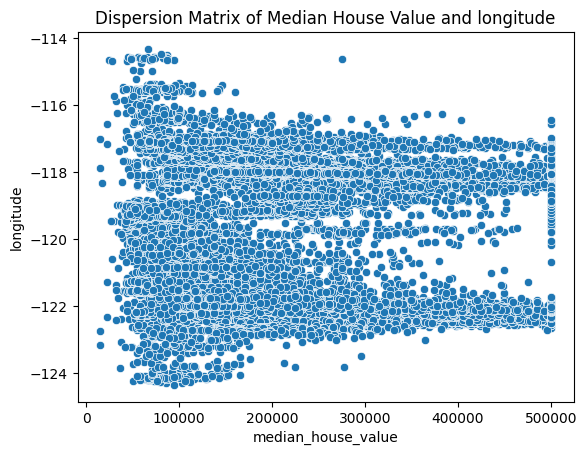

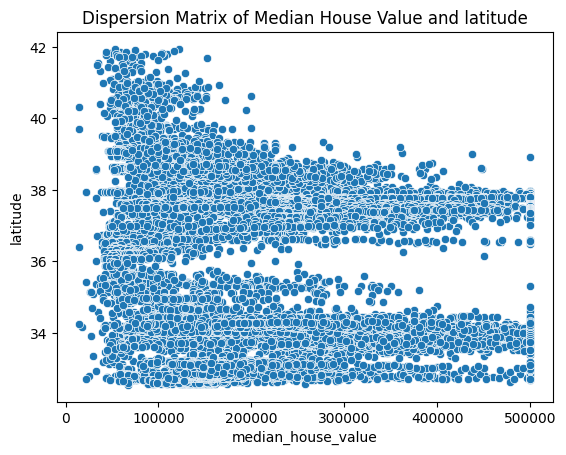

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['median_income', 'total_rooms', 'housing_median_age', 
             'households', 'total_bedrooms', 'population', 
             'longitude', 'latitude']

for variable in variables:
    sns.scatterplot(x='median_house_value', y=variable, data=data_num_filled_EDA)
    plt.title(f'Dispersion Matrix of Median House Value and {variable}')
    plt.show()

#If necessary it's posible to do the dispersion matrix between all the variables.
# sns.pairplot(data_num_filled_EDA)
# plt.show()

__Observations about Dispersion Matrixs:__
By means of the dispersion matrix we can reafirm in a grafic way what we had said before in the histograms, density plots and correlation:
- Housing median age: has the most homogeneous values.
- Median income: is the one that increase the most while the median house value increases

EDA. Visualisation of multidimensional data: parallel graph or Andrews curve

In [9]:
#Parallel Graph
import plotly.express as px
fig = px.parallel_coordinates(data_num_filled_EDA, color='median_house_value')
fig.show()

<h1 style="text-align:center;">TREATMENT OF THE DATA</h1>

We divide the initial dataset into training dataset (80%) and test dataset (20%), in order to train the models with the training dataset and then check them by comparing it with the test dataset.

In [10]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size = 0.2, random_state= 22)

train.to_csv("housing_train.csv", index = False)
test.to_csv("housing_test.csv", index = False)

We divide the training dataset into what is data and what is the target that we want to predict.

In [11]:
df_train = pd.read_csv("housing_train.csv")
data, target = df_train.drop(['median_house_value'], axis=1), df_train['median_house_value'].copy()
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-119.72,36.76,23.0,6403.0,NaN,3573.0,1260.0,2.3006,INLAND
1,-120.79,38.70,13.0,5036.0,1034.0,2243.0,923.0,2.3319,INLAND
2,-118.20,34.04,18.0,796.0,227.0,547.0,218.0,1.0333,<1H OCEAN
3,-117.34,33.21,12.0,5963.0,1372.0,3015.0,1124.0,2.7386,NEAR OCEAN
4,-121.46,38.54,48.0,1001.0,205.0,605.0,175.0,1.8333,INLAND


### **Dividing training dataset into numerical and categorical data**

**Numerical data**

In [12]:
data_num = data.drop(['ocean_proximity'], axis = 1)
data_num.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
0,-119.72,36.76,23.0,6403.0,NaN,3573.0,1260.0,2.3006
1,-120.79,38.70,13.0,5036.0,1034.0,2243.0,923.0,2.3319
2,-118.20,34.04,18.0,796.0,227.0,547.0,218.0,1.0333
3,-117.34,33.21,12.0,5963.0,1372.0,3015.0,1124.0,2.7386
4,-121.46,38.54,48.0,1001.0,205.0,605.0,175.0,1.8333


Dealing with the null values of the num data of the training dataset

In [13]:
data_num.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        163
population              0
households              0
median_income           0
dtype: int64

By means of Simpleimputer we fill the missing values with the median values.

In [14]:

imputer = SimpleImputer(strategy="median")
imputer.fit(data_num)
imputer.statistics_
X = imputer.transform(data_num)
data_num_filled = pd.DataFrame(X, columns=data_num.columns, index=data.index)
data_num_filled.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
dtype: int64

We standarized the numerical values.
Standardisation transforms the characteristics so that they have a mean of zero and a standard deviation of one. This helps to bring the characteristics on a common scale and facilitates comparison between them.

In [15]:
from IPython.display import display, Math

# Define la fórmula
formula = r'X_{\text{Standarized}} = \frac{x - \text{mean}}{\text{standard deviation}}'

# Muestra la fórmula usando IPython.display
display(Math(formula))


<IPython.core.display.Math object>

In [16]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_num_scaled = scaler.fit_transform(data_num)
data_tr = pd.DataFrame(data_num_scaled, columns=data_num.columns, index=data.index)
data_tr.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
count,1.651200e+04,1.651200e+04,1.651200e+04,1.651200e+04,1.634900e+04,1.651200e+04,1.651200e+04,1.651200e+04
mean,7.217525e-16,6.491362e-16,1.207583e-16,2.216143e-17,-2.933613e-18,7.627404e-17,4.028862e-17,-6.981926e-17
std,1.000030e+00,1.000030e+00,1.000030e+00,1.000030e+00,1.000031e+00,1.000030e+00,1.000030e+00,1.000030e+00
min,-2.381604e+00,-1.445235e+00,-2.201136e+00,-1.214416e+00,-1.278351e+00,-1.256377e+00,-1.310671e+00,-1.764526e+00
25%,-1.105456e+00,-7.998537e-01,-8.491991e-01,-5.457575e-01,-5.776820e-01,-5.636872e-01,-5.758077e-01,-6.848289e-01
50%,5.324548e-01,-6.455233e-01,2.558386e-02,-2.329159e-01,-2.440301e-01,-2.270859e-01,-2.333984e-01,-1.765975e-01
75%,7.819462e-01,9.679302e-01,6.617896e-01,2.338048e-01,2.564478e-01,2.609859e-01,2.723138e-01,4.571083e-01
max,2.628182e+00,2.950841e+00,1.854675e+00,1.631534e+01,1.407917e+01,3.034782e+01,1.470618e+01,5.825810e+00


**Categorical data**

In [17]:
data_no_num = data[['ocean_proximity']]
data_no_num['ocean_proximity'].unique()
print(data_no_num.shape)

(16512, 1)


ML models can only work with numerical data, so we transform non-numeric data into numerical format using OneHotEncoder.

In [18]:
# from sklearn.preprocessing import OneHotEncoder
# no_num_encoder = OneHotEncoder()
# data_no_num_encoded = no_num_encoder.fit_transform(data_no_num)
# data_no_num_encoded_df=pd.DataFrame(data_no_num_encoded.toarray()) 
# print(data_no_num_encoded_df)

mean_values = df_train.groupby('ocean_proximity')['median_house_value'].mean()
mean_values_sorted = mean_values.sort_values(ascending=False)
print(mean_values_sorted)

ocean_proximity
ISLAND        380440.000000
NEAR BAY      260036.062567
NEAR OCEAN    248683.788515
<1H OCEAN     240815.213153
INLAND        124414.913655
Name: median_house_value, dtype: float64


In [19]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('darkgrid')
sns.set_palette('pastel')

df = pd.read_csv('data_preproc.csv')

# %% Missing data: identificazione

df.replace("?", np.nan, inplace=True)  # sostituiamo il ?

missing_data = df.isnull()  # ricaviamo i nan nel dataframe

for column in missing_data.columns:
    n_missing = sum(missing_data[column])
    if n_missing > 0:
        print(f"{column}: {n_missing}/{missing_data.shape[0]} dati mancanti.")

# %% Missing data: gestione

# eliminazione dell'osservazione
df_del_row = df.copy(deep=True)
df_del_row.dropna(axis=0, inplace=True)
df_del_row.reset_index(inplace=True, drop=True)

# eliminazione della feature
df_del_col = df.copy(deep=True)
df_del_col.dropna(axis=1, inplace=True)

# sostituzione: dati numerici
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')  # median, constant, most_frequent
df[['Age', 'Salary']] = imputer.fit_transform(df[['Age', 'Salary']])

# sostituzione: dati non numerici
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
df[['Country']] = imputer.fit_transform(df[['Country']])


# %% Data encoding

# label encoding
label_encoder = LabelEncoder()
df_encoded_label = df.copy(deep=True)
df_encoded_label['Country'] = label_encoder.fit_transform(df_encoded_label['Country'])
print(df_encoded_label)

# %%


Country: 1/10 dati mancanti.
Age: 1/10 dati mancanti.
Salary: 1/10 dati mancanti.
   Country        Age        Salary Purchased
0        0  44.000000  72000.000000        No
1        2  27.000000  48000.000000       Yes
2        1  30.000000  54000.000000        No
3        2  38.000000  61000.000000        No
4        1  40.000000  63777.777778       Yes
5        0  35.000000  58000.000000       Yes
6        2  38.777778  52000.000000        No
7        0  48.000000  79000.000000       Yes
8        0  50.000000  83000.000000        No
9        0  37.000000  67000.000000       Yes


In [20]:

# import pandas as pd
# from sklearn.preprocessing import LabelEncoder
# # Create a copy of the DataFrame
# data_no_num_encoded = data_no_num.copy()
# # Create a LabelEncoder instance
# label_encoder = LabelEncoder()
# # Fit and transform the 'ocean_proximity' column
# encoded_labels = label_encoder.fit_transform(data_no_num['ocean_proximity'])
# data_no_num_encoded['ocean_proximity'] = encoded_labels
# # Display the mapping between initial values and encoded labels
# print("\nMapping between Initial Values and Encoded Labels:")
# unique_values = data_no_num['ocean_proximity'].unique()
# for value, encoded_label in zip(unique_values, label_encoder.transform(unique_values)):
#     print(f"{value} -> {encoded_label}")
# # Display the classes learned by the LabelEncoder
# print("\nLabel Encoder Classes:")
# print(label_encoder.classes_)

# print(data_no_num_encoded)
import pandas as pd
from sklearn.preprocessing import LabelEncoder

def label_encode_and_set_priority(data):
    # Copia del DataFrame
    data_encoded = data.copy()

    # LabelEncoder para 'ocean_proximity'
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(data['ocean_proximity'])
    data_encoded['ocean_proximity'] = encoded_labels

    # Definir la función set_priority
    def set_priority(column_data):
        priority_mapping = {0: 2, 4: 3, 3: 4, 2: 5, 1: 1}
        transformed_data = column_data.map(priority_mapping).fillna(-1)
        return transformed_data

    # Aplicar set_priority a 'ocean_proximity'
    data_encoded['ocean_proximity'] = set_priority(data_encoded['ocean_proximity'])

    # Mostrar el mapping entre valores iniciales y etiquetas codificadas
    #print("\nMapping between Initial Values and Encoded Labels:")
    #unique_values = data['ocean_proximity'].unique()
    #for value, encoded_label in zip(unique_values, label_encoder.transform(unique_values)):
        #print(f"{value} -> {encoded_label}")

    # # Mostrar las clases aprendidas por LabelEncoder
    # print("\nLabel Encoder Classes:")
    # print(label_encoder.classes_)

    # # Mostrar el DataFrame resultante
    # print("\nEncoded and Priority Transformed DataFrame:")
    # print(data_encoded)

    return data_encoded

# Llamar a la función con tu DataFrame original
data_no_num_encoded_prio = label_encode_and_set_priority(data_no_num)



Until this moment we have the Categorical values encoded but we wnat to set some priorities so we are going to change the number previosly assigned to :
- ISLAND: 5
- NEAR BAY: 4
- NEAR OCEAN: 3
- <1H OCEAN: 2 
- INLAND: 1

So far we have already dealt with all the information but we can systematise all  this process by using PIPELINES.

**PIPELINES**

In [21]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import numpy as np

num_attributes = list(data_num.columns)
cat_attributes = ["ocean_proximity"]

num_pipeline_with_scaling = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('scaler', StandardScaler()),    
])

num_pipeline_without_scaling = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
])

# Eliminamos la parte de la transformación categórica
full_pipeline_with_scaling = ColumnTransformer([
    ("num", num_pipeline_with_scaling, num_attributes),
    ("cat", "passthrough", cat_attributes)  # "passthrough" indica que no se realizará ninguna transformación
])

full_pipeline_without_scaling = ColumnTransformer([
    ("num", num_pipeline_without_scaling, num_attributes),
    ("cat", "passthrough", cat_attributes)  # "passthrough" indica que no se realizará ninguna transformación
])



# data_processed['ocean_proxim'] = 


**Explanation of what is done in the Pipeline:**
1. Separate numerical attributes from categorical ones.
2. Create a pipeline just for numecial attributes (num_pipeline) in which first we deal with null values by means of the SimpleImputer and then we standarize the values using the standard scaler.
3. Create a pipeline just for categorical attributes (cat_pipeline) in which it is just applied the One Hot Encoder. The use of this pipeline is also to give more scalability to the project.
4. Create the full pipeline, by means of the Colums Transformer we combine the 2 pipelines before created.
5. We use the full pipeline and get on data_processed all the data processed.
6. By printing data_processed.shape we can see that there are 13 columns (8 for numerical values + 5 from the categorical values encoded) confirming us that was correct.

In [22]:

def treat_data_with_scaling(data):
    pipeline_data = full_pipeline_with_scaling.fit_transform(data)
    data_no_num_encoded_prio = label_encode_and_set_priority(data_no_num)
    pipeline_data[:, -1] = data_no_num_encoded_prio['ocean_proximity']
    return pipeline_data


def treat_data_without_scaling(data):
    pipeline_data = full_pipeline_without_scaling.fit_transform(data)
    data_no_num_encoded_prio = label_encode_and_set_priority(data_no_num)
    pipeline_data[:, -1] = data_no_num_encoded_prio['ocean_proximity']
    return pipeline_data


# data_processed = treat_data_with_scaling(data)
# data_processed_without_scaling = treat_data_without_scaling(data)



# print(data_processed_without_scaling)

<h1 style="text-align:center;">Models Analysis</h1>


After analyzing all the models we create a function in order to display the mean and the variation to analyze the acurracy of the model (the lower this values are, the better)

In [23]:
def display_score(sc):
    print("Score:", sc)
    print("Mean:", sc.mean())
    print("Std deviation:", sc.std())

Models to analyze:
1. Linear Regression.
2. Decision Tree.
3. Random Forest.

To validate each model we will compute their MSE (Mean Squared Error) but in order to facilitate it interpretation we will get the RMAE (Root Mean Absolute Error) because it is with the same units as the prediction.

After this and to be able to compare it with the RMAE of the other models we will compute the mean and the standart desviation.


# 1.Linear Regression
Supervised Learning algorithm that achieve a linear relationship between a dependent variable (target) and one ore more independent variables (data_processed).

In [24]:
from sklearn.linear_model import LinearRegression
data_processed_for_linear_regression = treat_data_without_scaling(data)

linear_regression = LinearRegression()

#Training the model.
linear_regression.fit(data_processed_for_linear_regression, target)

from sklearn.model_selection import cross_val_score
import numpy as np

#Validation.
scores = cross_val_score(linear_regression, data_processed_for_linear_regression, target, scoring="neg_mean_squared_error", cv=10)
score_processed_LR = np.sqrt(-scores)
display_score(score_processed_LR)

Score: [64473.62326197 68537.68816479 69428.68933951 74096.98969669
 72556.70646994 68548.61075289 69980.21855896 71853.97037515
 71546.63330384 67526.01922727]
Mean: 69854.91491510038
Std deviation: 2649.036636189313


Optimisation of Hyper-parameters Linear Regression

In [25]:
hyperparameters = linear_regression.get_params()
print("Hyperparameters of the linear regression model:")
for param, value in hyperparameters.items():
    print(f"{param}: {value}")


Hyperparameters of the linear regression model:
copy_X: True
fit_intercept: True
n_jobs: None
positive: False


In [26]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'fit_intercept': [True, False],
    'positive': [True, False],
    'copy_X': [True, False]
}

grid_search = GridSearchCV(linear_regression, param_grid, cv=5, scoring='neg_mean_squared_error', return_train_score=True, n_jobs=-1)
grid_search.fit(data_processed_for_linear_regression, target)

grid_search.best_params_



{'copy_X': True, 'fit_intercept': True, 'positive': False}

In [27]:
from sklearn.linear_model import LinearRegression

linear_regression = LinearRegression(copy_X= True, fit_intercept= True, positive= False)

#Training the model.
linear_regression.fit(data_processed_for_linear_regression, target)

from sklearn.model_selection import cross_val_score
import numpy as np

#Validation.
scores = cross_val_score(linear_regression, data_processed_for_linear_regression, target, scoring="neg_mean_squared_error", cv=10)
score_processed_LR = np.sqrt(-scores)
display_score(score_processed_LR)

Score: [64473.62326197 68537.68816479 69428.68933951 74096.98969669
 72556.70646994 68548.61075289 69980.21855896 71853.97037515
 71546.63330384 67526.01922727]
Mean: 69854.91491510038
Std deviation: 2649.036636189313


# 2.Decision Tree

A decision tree is a supervised learning algorithm that makes decisions based on simple questions about the data. Each "node" in the tree represents a question, the "branches" are the possible answers to that question, and the "leaves" represent the final decisions. The tree is constructed by dividing the dataset into more homogeneous subsets based on the answers to the questions, with the goal of making accurate predictions.

In [28]:
from sklearn.tree import DecisionTreeRegressor

data_processed_for_decision_tree_and_random_forest = treat_data_with_scaling(data)

tree_regression = DecisionTreeRegressor(random_state=42)

#Trainig the model.
tree_regression.fit(data_processed_for_decision_tree_and_random_forest, target)

#Validation.
scores = cross_val_score(tree_regression, data_processed_for_decision_tree_and_random_forest, target, scoring="neg_mean_squared_error", cv=10)
score_processed_TR = np.sqrt(-scores)
display_score(score_processed_TR)

Score: [64234.06601043 67177.67816125 68101.02133867 67841.88548624
 67786.53675885 70036.66047826 70238.39554521 71040.23055402
 70382.77088777 70664.40647958]
Mean: 68750.36517002754
Std deviation: 2012.1338557909244


Optimisation of Hyper-parameters Decision Tree

In [29]:
hyperparameters = tree_regression.get_params()
print("Hyperparameters of the Decisio Tree model:")
for param, value in hyperparameters.items():
    print(f"{param}: {value}")

Hyperparameters of the Decisio Tree model:
ccp_alpha: 0.0
criterion: squared_error
max_depth: None
max_features: None
max_leaf_nodes: None
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
random_state: 42
splitter: best


In [30]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [None, 5, 7, 8, 9, 10, 20, 30],
    'min_samples_split': [2, 3, 4, 5, 10, 20, 30, 40, 50],
    'min_samples_leaf': [1, 2, 4, 10, 20, 30, 40],
    'max_features': [None, 'sqrt', 'log2'],
    'ccp_alpha': [0.0, 0.1, 0.2],
    'random_state': [42],
    'splitter': ['best', 'random']
}


grid_search = GridSearchCV(tree_regression, param_grid, cv=5, scoring='neg_mean_squared_error', return_train_score=True, n_jobs=-1)
grid_search.fit(data_processed_for_decision_tree_and_random_forest, target)
grid_search.best_params_


{'ccp_alpha': 0.0,
 'max_depth': None,
 'max_features': None,
 'min_samples_leaf': 10,
 'min_samples_split': 40,
 'random_state': 42,
 'splitter': 'best'}

In [31]:
# tree_regression = DecisionTreeRegressor(ccp_alpha=0.0, max_depth=10, max_features=None,min_samples_leaf=4, min_samples_split=10, splitter="best" ,random_state=42)
tree_regression = DecisionTreeRegressor(ccp_alpha=0.0, max_depth=None, max_features=None,min_samples_leaf=20, min_samples_split=2, splitter="best" ,random_state=42)


#Trainig the model.
tree_regression.fit(data_processed_for_decision_tree_and_random_forest, target)

#Validation.
scores = cross_val_score(tree_regression, data_processed_for_decision_tree_and_random_forest, target, scoring="neg_mean_squared_error", cv=10)
score_processed_TR = np.sqrt(-scores)
display_score(score_processed_TR)

Score: [52804.36470848 56250.02574571 59983.60120565 60395.94759259
 57152.78848135 60884.03446089 60224.31890247 60166.37506713
 57723.53516353 55998.01557517]
Mean: 58158.300690295684
Std deviation: 2494.8397860505584


# 3. Random Forest 
Supervised Learning algorithm that builds multiple decision trees during training and merges their predictions to provide a more robust and accurate result. Each tree is constructed on a random subset of the training data.

In [32]:
from sklearn.ensemble import RandomForestRegressor

rf_regression = RandomForestRegressor(random_state=42)

#Training the model.
rf_regression.fit(data_processed_for_decision_tree_and_random_forest, target)

#Validation.
scores = cross_val_score(rf_regression,data_processed_for_decision_tree_and_random_forest, target, scoring="neg_mean_squared_error", cv=10)
score_processed_RF = np.sqrt(-scores)
display_score(score_processed_RF)

Score: [43202.40308655 48135.46325043 49989.23091422 49049.16863003
 49656.61598868 50699.32286701 51065.07192793 52159.68491334
 50636.48605276 46857.49389795]
Mean: 49145.09415288966
Std deviation: 2448.7837504818117


Optimisation of Hyper-parameters Random Forest


In [33]:
from sklearn.ensemble import RandomForestRegressor
rf_regression = RandomForestRegressor(random_state=42)
hyperparameters = rf_regression.get_params()
print("Hyperparameters of the Random Forest model:")
for param, value in hyperparameters.items():
    print(f"{param}: {value}")

Hyperparameters of the Random Forest model:
bootstrap: True
ccp_alpha: 0.0
criterion: squared_error
max_depth: None
max_features: 1.0
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: 42
verbose: 0
warm_start: False


After this visualization of the parameters we can see that the ones interesting to evaluate are: max_features, n_estimators.
    -n_estimators: number of trees in the random forest.
    -max_features: number of features each tree can have

In [34]:
from sklearn.model_selection import GridSearchCV

# Using this param_grid the vscode stops going
# param_grid = {
#     'n_estimators': [50, 100, 150],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4],
#     'max_features': ['auto', 'sqrt', 'log2'],
#     'bootstrap': [True, False],
#     'ccp_alpha': [0.0, 0.1, 0.2],
#     'random_state': [42],
#     'n_jobs': [None, -1],
#     'oob_score': [False, True],
#     'warm_start': [False, True]
# }

param_grid = [
    {'n_estimators': [2, 5, 10, 20, 30, 40, 50], 'max_features': [2, 4, 6, 8, 10, 12, 14]},
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]

forest_reg = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error', return_train_score=True, n_jobs=-1)
grid_search.fit(data_processed_for_decision_tree_and_random_forest, target)

grid_search.best_params_

{'max_features': 6, 'n_estimators': 50}

Once we already have all the best parameters, we proceed to test the outcomes of the model

In [35]:
from sklearn.ensemble import RandomForestRegressor

rf_regression = RandomForestRegressor(random_state=42, n_estimators=50, max_features=6)

#Aqui entrenamamos el modelo.
rf_regression.fit(data_processed_for_decision_tree_and_random_forest, target)

#El modelo LR ya ha sido entrenado entonces validamos el ese modelo con la data_processed y el target
scores = cross_val_score(rf_regression, data_processed_for_decision_tree_and_random_forest, target, scoring="neg_mean_squared_error", cv=10)
score_processed_RF = np.sqrt(-scores)
display_score(score_processed_RF)

Score: [42762.53400362 47666.50517164 49530.93319748 49249.55648407
 50110.86538748 50050.43634728 50345.41264939 52016.61194741
 50771.43250767 46698.49037603]
Mean: 48920.27780720518
Std deviation: 2502.9431411354863


### **Display of all the results**

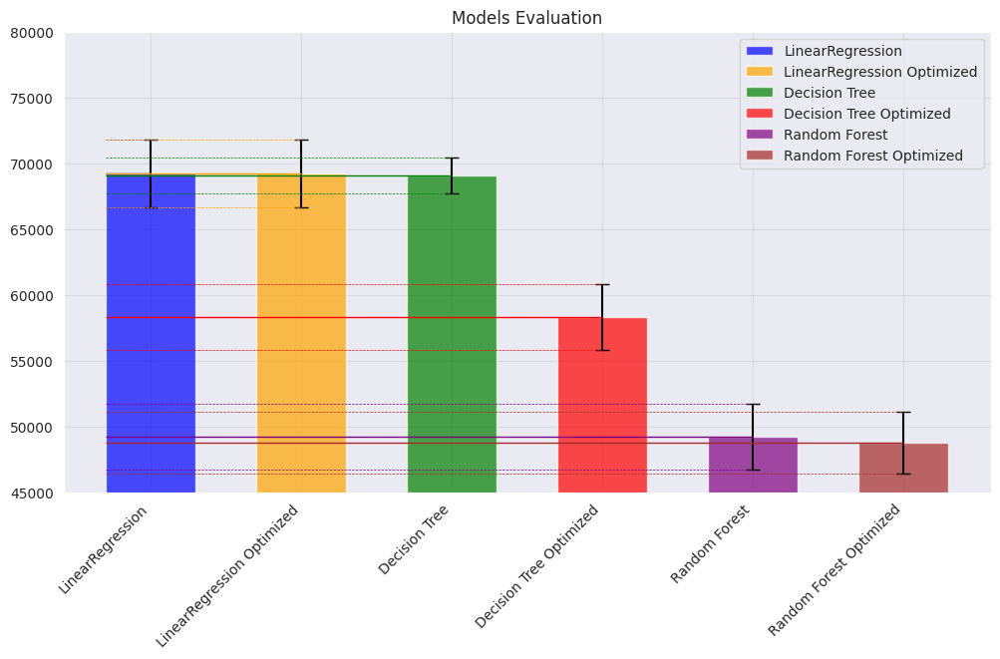

In [36]:
import matplotlib.pyplot as plt
import numpy as np

model_names = ['LinearRegression', 'LinearRegression Optimized', 'Decision Tree', 'Decision Tree Optimized', 'Random Forest', 'Random Forest Optimized']
# list_mean = [69228.23291191524, 69228.23291191524, 69058.95246575619, 69058.95246575619, 49213.61564069473, 48796.14013638545]
# list_sd = [2575.2001334016063, 2575.2001334016063, 1386.0890432795886, 2445.1066509610637, 2483.8518439097506, 2342.8472836394603]
list_mean = [69228.23291191524, 69228.23291191524, 69058.95246575619, 58334.36740313638, 49213.61564069473, 48796.14013638545]
list_sd = [2575.2001334016063, 2575.2001334016063, 1386.0890432795886, 2483.8518439097506, 2483.8518439097506, 2342.8472836394603]

plt.figure(figsize=(12, 6))
x_values = np.arange(len(model_names))
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']
bars = plt.bar(x_values, list_mean, yerr=list_sd, color=colors, capsize=5, width=0.6, align='center', alpha=0.7, label=model_names)

plt.xticks(x_values, model_names, rotation=45, ha='right') 
plt.title("Models Evaluation")
plt.ylim(45000, 80000)
plt.grid(True, which='major', color='#666666', linestyle='-')
plt.minorticks_on()
plt.grid(True, which='major', color='#999999', linestyle='-', alpha=0.2)
plt.legend()

for i, bar in enumerate(bars):
    color = colors[i] 
    plt.hlines(y=list_mean[i] + list_sd[i], xmin=0 - 0.3, xmax=x_values[i], color=color, linestyle='dashed', linewidth=0.5)
    plt.hlines(y=list_mean[i] - list_sd[i], xmin=0 - 0.3, xmax=x_values[i], color=color, linestyle='dashed', linewidth=0.5)
    plt.hlines(y=list_mean[i], xmin=0 - 0.3, xmax=x_values[i], color=color, linestyle='solid', linewidth=1)

plt.show()


<h1 style="text-align:center;">TEST OF THE FINAL MODEL</h1>

In [39]:
from sklearn.metrics import mean_squared_error

test_data = pd.read_csv('housing_test.csv')

final_model = grid_search.best_estimator_
print("The best model founded was: "+ str(final_model))

data_test = test_data.drop("median_house_value", axis=1)
target_test = test_data["median_house_value"].copy()

data_test_prepared = treat_data_with_scaling(data_test)
final_predictions = final_model.predict(data_test_prepared)

final_mse = mean_squared_error(target_test, final_predictions)
final_rmse = np.sqrt(final_mse)

min_price = target_test.min()
max_price = target_test.max()

print("Lower Price:", min_price)
print("Higher Price:", max_price)
print("Root Mean Squared Error:" ,final_rmse  )

The best model founded was: RandomForestRegressor(max_features=6, n_estimators=50, random_state=42)


ValueError: could not broadcast input array from shape (16512,) into shape (4128,)

After having this values we are able to compute the % of Error of our model

In [ ]:
error_rate = (final_rmse/(max_price-min_price))*100
print("Error rate of the Final Model is: " + str(error_rate)+ " %")

# **Conclusion of the proyect:**
After dealing with the data, analyzing 3 different ML models and optimizing their hyperparameters we can conclude saying that: The best model we were able to get was the Random Forest that can predict the values of the houses with an error rate of 9.907208732761733 %